Test du Modèle UNET pour la segmentation des feuilles sur un fond

In [ ]:
#Initialisation du google drive
from google.colab import drive
drive.mount('/gdrive')

#Lien: https://drive.google.com/drive/folders/1vkE4PW2dqjFF7_bn3R2VIvI6covY3xkh?usp=sharing

Mounted at /gdrive


# 1.0.Telechargement et décompression du dataset sélectionné

In [ ]:
#install Kaggle
!pip install -q kaggle

from google.colab import files
files.upload()


#create kaggle folder
!mkdir ~/.kaggle

#copy kaggle.jason ~/.kaggle
! cp kaggle.json ~/.kaggle

#permission for json to act
! chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download abdallahalidev/plantvillage-dataset
!unzip plantvillage-dataset.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/6e345153-aed9-4879-a2cc-24f9dc5100e7___UF.GRC_YLCV_Lab 01798_final_masked.jpg  
  inflating: plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/6e37e8ad-3944-4e11-bc10-dd82616274d7___YLCV_NREC 2915_final_masked.jpg  
  inflating: plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/6e382244-fb3a-4caa-af71-05fff25f1c27___UF.GRC_YLCV_Lab 03397_final_masked.jpg  
  inflating: plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/6e3b9886-ce13-49d5-8f80-ccf4e5ddbeac___YLCV_GCREC 5479_final_masked.jpg  
  inflating: plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/6e615038-7a87-446a-a2cd-f76c5c75b6dd___YLCV_GCREC 5144_final_masked.jpg  
  inflating: plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/6e6938d9-1ab0-4728-993c-1069b66ce73b___UF.G

#2.Import des packages

In [ ]:
#Librairies communes
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Autres librairies communes utiles au projet
import time, cv2
import os
import glob, cv2
import random
import tensorflow as tf

#sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

#tensorflow
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, GlobalAveragePooling2D, BatchNormalization,Activation,Conv2D,MaxPooling2D,AveragePooling2D
from tensorflow.keras.optimizers import Adam
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers.merge import concatenate, add
from keras.layers import UpSampling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import Model,Input,callbacks
from tensorflow.keras.utils import to_categorical

#keras
from keras.preprocessing import image


def matrice_confusion(x, y, xlabel, ylabel, figsize=(10,8), normalize='true', vmin=0, vmax=1, fmt='.0%', cmap=None):
    from sklearn.metrics import confusion_matrix
    cm = confusion_matrix(x, y, normalize=normalize)

    label = pd.concat([x, y],axis=0).sort_values().unique()

    df_cm = pd.DataFrame(cm, index=label, columns=label)

    df_cm.index.name = xlabel
    df_cm.columns.name = ylabel

    plt.figure(figsize=figsize)  
    ax = sns.heatmap(df_cm, annot=True, vmin=vmin, vmax=vmax, fmt=fmt, cmap=cmap)


#3.Preprocessing



### Initialisation des chemins et des classes

In [ ]:
#Initialisation des chemins pour aller chercher les images dans le google drive
#chemin_image = '/gdrive/MyDrive/epyphyte/donnees/plantvillage_dataset/color'
chemin_image = 'plantvillage dataset/color'
chemin_image_segmented = 'plantvillage dataset/segmented'
chemin_image_fond = '/gdrive/MyDrive/epyphyte/donnees/photos_reelles/Fonds'
chemin_image_test = '/gdrive/MyDrive/epyphyte/donnees/test'  # 53 photos réelles
chemin_image_test2 = '/gdrive/MyDrive/epyphyte/donnees/test2' # 53 photos color
chemin_image_test3 = '/gdrive/MyDrive/epyphyte/donnees/test3' # 53 photos segmented
chemin_photos_vacances = '/gdrive/MyDrive/photos'


# enregistrement
version = 'test_unet_#7'  
checkpoint_filepath = '/gdrive/MyDrive/epyphyte/entrainement/checkpoints/'+version
save_folder='/gdrive/MyDrive/epyphyte/entrainement/modeles/'+version

path_segmented='/gdrive/MyDrive/epyphyte/donnees/plantvillage_dataset/segmented'
path_color='/gdrive/MyDrive/epyphyte/donnees/plantvillage_dataset/color'
path_fond='/gdrive/MyDrive/epyphyte/donnees/photos_reelles/Fonds/Fond_01.jpg'

#Paramètres de modélisation               
largeur = 224
hauteur = 224
profondeur = 3
EPOCHS = 30
batch_size = 32

#Dictionnaires liens numéros <> classes
df = pd.read_csv('/gdrive/MyDrive/epyphyte/donnees/info_maladie.csv', sep=';')


def dataframe_to_dictionnary(dataframe, cle, valeur):
  # Renvoie un dictionnaire à partir de 2 colonnes d'un dataframe
  df_temp = dataframe[[cle, valeur]].set_index(cle)
  return df_temp[valeur].to_dict()

CLASSES = dataframe_to_dictionnary(df, 'dossier', 'classe')
reversed_classes = dataframe_to_dictionnary(df, 'classe', 'dossier')

nb_classes = len(CLASSES)
#print("Le nombre de classes est: ",nb_classes)

In [ ]:
#transformation de la lecture du repertoire chemin_segmented en une fonction


def repertoire_to_df(chemin):


  #Construction du DataFrame avec le chemin des images et les catégories
  df_chemin = pd.DataFrame()
  #for (repertoire, sousRepertoires, fichiers) in os.walk(path_segmented):
  for (repertoire, sousRepertoires, fichiers) in os.walk(chemin):
      df_temp = pd.DataFrame(data=fichiers, columns=['fichier'])
      df_temp['dossier'] = repertoire
      df_chemin = pd.concat([df_chemin, df_temp], axis = 0)

  df_chemin['chemin_segmented'] = df_chemin['dossier'] +'/'+ df_chemin['fichier']
  #print(df_chemin.iloc[0]['dossier'])
  #print(df_chemin.iloc[0]['fichier'])
  #print(df_chemin.iloc[0]['chemin_segmented'])
  df_chemin['dossier']=df_chemin['dossier'].apply(lambda x: x[31:])

  df_chemin['plante_maladie']=df_chemin['dossier'].apply(lambda x: x.split('/')[0])
  df_chemin['plante']=df_chemin['plante_maladie'].apply(lambda x: x.split('___')[0])
  df_chemin['maladie']=df_chemin['plante_maladie'].apply(lambda x: x.split('___')[1])

  df_chemin = df_chemin.drop('dossier', axis=1)
  df_chemin = df_chemin.drop('fichier', axis=1)

  df_chemin['chemin_color']=df_chemin['chemin_segmented'].apply(lambda x: x.replace("segmented","color",1))
  df_chemin['chemin_color']=df_chemin['chemin_color'].apply(lambda x: x.replace("_final_masked","",1))
  df_chemin['chemin_color']=df_chemin['chemin_color'].apply(lambda x: x.replace("jpg","JPG",1))

  return df_chemin

df_chemin=repertoire_to_df(chemin_image_segmented)

In [ ]:
# creation du DataFrame pour les images de test réelles
# copie de ces images sur le disque du colab (plus rapide + homogène aux images "segmented")


def repertoire_test_to_df(chemin):


  #Construction du DataFrame avec le chemin des images et les catégories
  df_chemin = pd.DataFrame()
  #for (repertoire, sousRepertoires, fichiers) in os.walk(path_segmented):
  for (repertoire, sousRepertoires, fichiers) in os.walk(chemin):
      df_temp = pd.DataFrame(data=fichiers, columns=['fichier'])
      df_temp['dossier'] = repertoire
      df_chemin = pd.concat([df_chemin, df_temp], axis = 0)

  df_chemin['chemin_segmented'] = df_chemin['dossier'] +'/'+ df_chemin['fichier']

  df_chemin['dossier']=df_chemin['dossier'].apply(lambda x: x[15:])
  df_chemin['plante_maladie']=df_chemin['dossier'].apply(lambda x: x.split('/')[0])
  df_chemin['plante']=df_chemin['plante_maladie'].apply(lambda x: x.split('___')[0])
  df_chemin['maladie']=df_chemin['plante_maladie'].apply(lambda x: x.split('___')[1])

  df_chemin = df_chemin.drop('dossier', axis=1)
  df_chemin = df_chemin.drop('fichier', axis=1)

  return df_chemin

chemin_images_reelles = 'images_reelles'
emplacement_src_gdrive = '/gdrive/MyDrive/epyphyte/donnees/test'

import shutil
#if not os.path.isdir('/chemin_images_reelles'):
shutil.copytree(emplacement_src_gdrive,chemin_images_reelles)

df_chemin_test=repertoire_test_to_df(chemin_images_reelles)
df_chemin_test.head()

,chemin_segmented,plante_maladie,plante,maladie
0,images_reelles/Apple___Apple_scab/Pommier-tave...,Apple___Apple_scab,Apple,Apple_scab
1,images_reelles/Apple___Apple_scab/Pommier-Tave...,Apple___Apple_scab,Apple,Apple_scab
2,images_reelles/Apple___Apple_scab/Pommier-Tave...,Apple___Apple_scab,Apple,Apple_scab
3,images_reelles/Apple___Apple_scab/Pommier-tave...,Apple___Apple_scab,Apple,Apple_scab
4,images_reelles/Apple___Apple_scab/Pommier-Tave...,Apple___Apple_scab,Apple,Apple_scab


In [ ]:
# Onehot encoding des deux etiquettes : non utiisé dans la suite -> tocategorical() dans la fct de generation des donnees
df_chemin_2=df_chemin
df_chemin_2=df_chemin_2.drop(['chemin_color'],axis=1)
A=pd.get_dummies(df_chemin_2['plante'])
B=pd.get_dummies(df_chemin_2['maladie'])
#df_chemin_2=pd.concat([df_chemin_2,A],axis=1)
#df_chemin_2=pd.concat([df_chemin_2,B],axis=1)


df_plante = pd.concat([df_chemin_2['plante'],A],axis=1)
df_maladie = pd.concat([df_chemin_2['maladie'],B],axis=1)
Nplantes = len(df_chemin_2['plante'].unique())
Nmaladies= len(df_chemin_2['maladie'].unique())

print('Nombre plante=',Nplantes)
print('Nombre maladie=',Nmaladies)
              


#df_chemin_2=df_chemin_2.drop(['plante','maladie'],axis=1)

df_chemin_2

Nombre plante= 14
Nombre maladie= 21


,chemin_segmented,plante_maladie,plante,maladie
0,plantvillage dataset/segmented/Tomato___Tomato...,Tomato___Tomato_Yellow_Leaf_Curl_Virus,Tomato,Tomato_Yellow_Leaf_Curl_Virus
1,plantvillage dataset/segmented/Tomato___Tomato...,Tomato___Tomato_Yellow_Leaf_Curl_Virus,Tomato,Tomato_Yellow_Leaf_Curl_Virus
2,plantvillage dataset/segmented/Tomato___Tomato...,Tomato___Tomato_Yellow_Leaf_Curl_Virus,Tomato,Tomato_Yellow_Leaf_Curl_Virus
3,plantvillage dataset/segmented/Tomato___Tomato...,Tomato___Tomato_Yellow_Leaf_Curl_Virus,Tomato,Tomato_Yellow_Leaf_Curl_Virus
4,plantvillage dataset/segmented/Tomato___Tomato...,Tomato___Tomato_Yellow_Leaf_Curl_Virus,Tomato,Tomato_Yellow_Leaf_Curl_Virus
...,...,...,...,...
995,plantvillage dataset/segmented/Tomato___Early_...,Tomato___Early_blight,Tomato,Early_blight
996,plantvillage dataset/segmented/Tomato___Early_...,Tomato___Early_blight,Tomato,Early_blight
997,plantvillage dataset/segmented/Tomato___Early_...,Tomato___Early_blight,Tomato,Early_blight
998,plantvillage dataset/segmented/Tomato___Early_...,Tomato___Early_blight,Tomato,Early_blight


In [ ]:
liste_plante =  df_chemin_2['plante'].unique()
Nplantes = len(liste_plante)
liste_plante=pd.DataFrame(liste_plante)
liste_plante = pd.concat([liste_plante,pd.DataFrame(np.arange(Nplantes))],axis=1)
liste_plante.columns = ['plante','code_plante']

CLASSES_plantes = dataframe_to_dictionnary(liste_plante, 'plante', 'code_plante')
reversed_classes_plantes = dataframe_to_dictionnary(liste_plante, 'code_plante', 'plante')

liste_maladie =  df_chemin_2['maladie'].unique()
Nmaladies = len(liste_maladie)
liste_maladie=pd.DataFrame(liste_maladie)
liste_maladie = pd.concat([liste_maladie,pd.DataFrame(np.arange(Nmaladies))],axis=1)
liste_maladie.columns = ['maladie','code_maladie']

CLASSES_maladies = dataframe_to_dictionnary(liste_maladie, 'maladie', 'code_maladie')
reversed_classes_maladies = dataframe_to_dictionnary(liste_maladie, 'code_maladie', 'maladie')
df_chemin_3 = df_chemin_2

df_chemin_3.head()

def code_label(df):


  df['code_plante']=df['plante'].apply(lambda x : CLASSES_plantes[x])
  df['code_maladie']=df['maladie'].apply(lambda x : CLASSES_maladies[x])

  df['code_plante_maladie']=1000*df["code_plante"]+df['code_maladie']
  df['code_plante_maladie']=df['code_plante_maladie'].apply(lambda x : [x//1000,x%1000])
  df['code_plante_maladie_combine']=df['plante_maladie'].apply(lambda x : CLASSES[x])

  return df

df_chemin_3=code_label(df_chemin_3)
df_chemin_3=pd.concat([df_chemin_3,A],axis=1)
df_chemin_3=pd.concat([df_chemin_3,B],axis=1)


df_chemin_test = code_label(df_chemin_test)


### Gestion des fonds

In [ ]:
chemin_photos_vacances = 'photos_vacances'
os.mkdir(chemin_photos_vacances)
shutil.copyfile('/gdrive/MyDrive/photos.tar', 'photos_vacances/photos.tar')

'photos_vacances/photos.tar'

In [ ]:
import tarfile
tar = tarfile.open("photos_vacances/photos.tar")
tar.extractall()
tar.close()



In [ ]:
os.remove('photos_vacances/photos.tar')

In [ ]:
# temps d'execution dans cet état : 20 min 14s !
# peut-être diminué en diminuant le nbre d'iter de la boucle de sous-image
# ou la boucle initiale

liste_img_fond = []


#Recherche et chargement de la liste des images de fonds : on extrait des sous images de chaque photo
for fichier in glob.glob('photos' + '/**/*.*', recursive=True):
  img_fond = cv2.imread(fichier)
  img_fond = cv2.cvtColor(img_fond, cv2.COLOR_BGR2RGB)
  X=img_fond.shape[0]-225-225
  Y=img_fond.shape[1]-225-225
  
  
  for i in range(300):
    
    
    
    Xr=int(X*random.random())
    Yr=int(Y*random.random())
    L=224+int(-124+448*random.random())
    l=224+int(-124+448*random.random())
    img = img_fond[Xr:Xr+L-1,Yr:Yr+l-1,:]
    img = cv2.resize(img, (largeur,hauteur))
   
    # si la sous-image est assez "verte", on la conserve
    if np.linalg.norm(img[:,:,1],'fro')> np.sqrt(np.linalg.norm(img[:,:,0],'fro')**2+np.linalg.norm(img[:,:,2],'fro')**2):
      if random.random()>.5:
        img = np.flipud(img)
      if random.random()>.5:
        img = np.fliplr(img)
      if random.random()>.5:
        img = cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE)
      liste_img_fond.append(img)

  #print(fichier)

In [ ]:
print("Nombre d'images de fond =",len(liste_img_fond))

Nombre d'images de fond = 9973


In [ ]:
# Fonction d'inscrustation de la feuille dans le fond pour segmentation
# j'ai gardé le même nom que pour plantes/maladie, je sais, ce n'est pas bien pour le merge des deux scripts



#Définition de la fonction de preprocessing : augmentation de données par transformation géométrique
def preprocess_input2(img, sans_fond=False,color=False,resize=True):
 

  #symétrie axiale droite/gauche
  if random.random()>0.5:
    img = np.fliplr(img)

  #symétrie axiale haut/bas
  if random.random()>0.5:
    img = np.flipud(img)

  # Rotation 90°
  if random.random()>0.5:
    img = cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE)

  if resize:
    # zoom : avec proba 1/2, on diminue la taille de la feuille jusqu'à 50%, sinon on peut l'augmenter jusqu'à 200%
    if random.random()>0.5:
      a=0.5+0.5*random.random()
      img_r = cv2.resize(img,(int(a*largeur),int(a*hauteur)))
      s=img_r.shape  
      img = np.zeros((224,224,3))
    
      x=int(random.random()*(224-s[0]-2))
      y=int(random.random()*(224-s[1]-2))
      #print(s,x,y)

      img[x:x+s[0],y:y+s[1],:]=img_r
     

    else :

      a= 1+random.random()
      img_r=cv2.resize(img,(int(a*largeur),int(a*hauteur)))
      s=img_r.shape 
      x=int(random.random()*(s[0]-224))
      y=int(random.random()*(s[1]-224))   
      img = img_r[x:x+224,y:y+224,:]

  # tambouille d'inscrustation : erosion du masque pour supprimer l'effet liseré
  G=img[:,:,1]
  G.shape=(224,224,1)
  G = np.tile(G,(1,1,3))
  masque = np.where((G<=10) , np.zeros(shape=(224,224,3)), np.ones(shape=(224,224,3)))
  kernel = np.ones((7,7),np.uint8)
  masque = cv2.erode(masque,kernel,iterations = 1)
  masque1 = masque[:,:,2]

  #modification du fond et de l'image
  fond = (random.choice(liste_img_fond)).astype(int)
  if not sans_fond :
    if color:
      fond, img = changement_color_rnd_fondetfeuille(fond,img,masque1)
    else:
      fond, img = changement_luminance_NB2(fond,img,masque1)

  if color :
    masque2=masque
  else :
    masque=masque1

  fond= fond.astype(int)
  img= img.astype(int)


 
  #img = np.where(masque==0, random.choice(liste_img_fond), img1)
  #return preprocess_input(np.where(masque==0, np.zeros(shape=(224,224,3)), img))
  # attenuation d'un facteur p
  if  resize:
    p=0.2+0.8*random.random()
  else:
    p=1

  if not sans_fond :
    return np.where(masque2==0,p*fond,p*img), masque1
  else:
    return np.where(masque2==0,np.zeros(shape=(224,224,1)), p*img), masque1


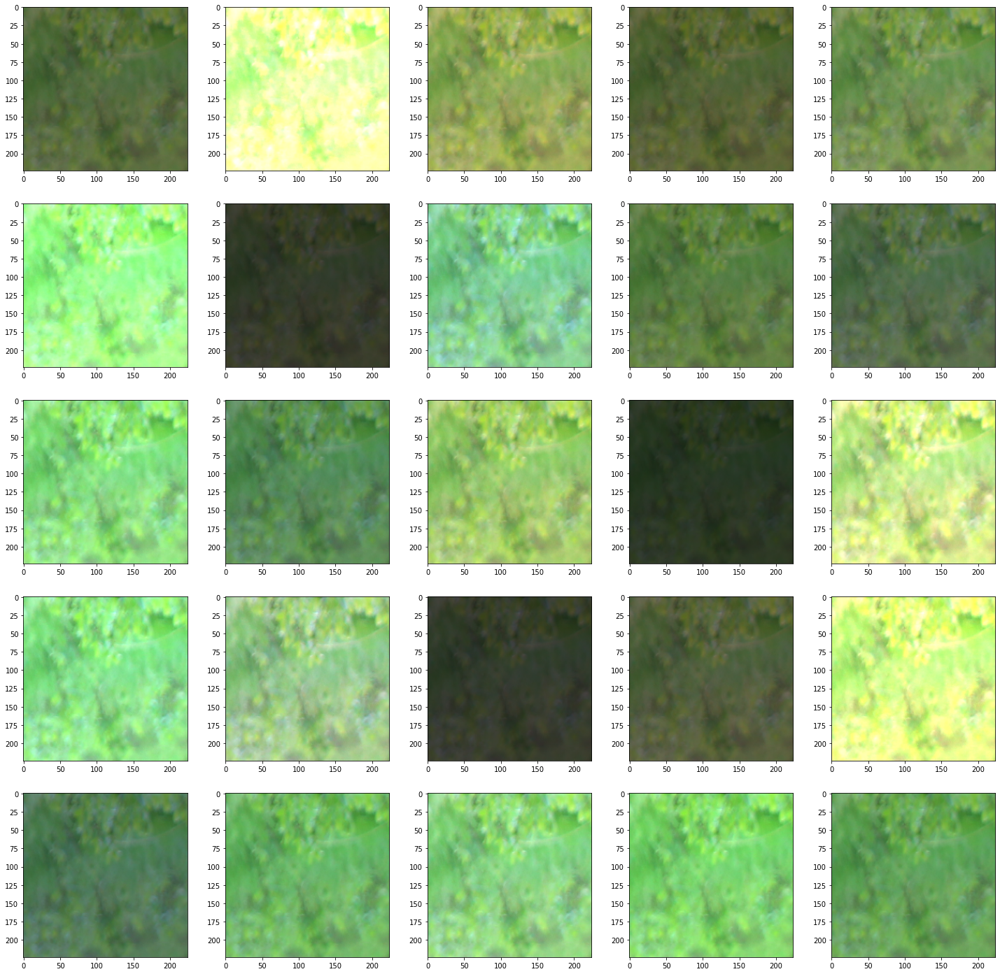

In [ ]:
# Fonction changeant aléatoire la température de couleur de l'imahe defond
def changement_color_rnd(img):

  img_n=img/255


  g=0.2+1.6*random.random()
  b=0.8+0.4*random.random()
  r=0.8+0.4*random.random()

  # On change la luminance assimilié au canal vert (facteur b), puis le rapport entre le rouge et le bleu pour la temp de couleur, en changeant le rouge 
  bl=[];
  
  bl.append(g*b)
  bl.append(g)
  bl.append(g*r)  

  for j in [1,0,2]:

    img_n[:,:,j] = bl[j]*img_n[:,:,j]

  
  img_n=255*img_n

  img_n = np.where(img_n>255,255*np.ones(shape=(224,224,3)),img_n)
  img_n= np.where(img_n<0,np.zeros(shape=(224,224,3)),img_n)
  


  return img_n


#test de la fonction sur une des images de fond
img = random.choice(liste_img_fond)

plt.figure(figsize=(25,25))
for j in range (25):
  plt.subplot(5,5,j+1)
  img2=changement_color_rnd(img)
  plt.imshow(img2/255)

In [ ]:

# tentative d'inscrustation de l'image dans un fond en couleur

def changement_color_rnd_fondetfeuille(img_fond,img_feuille,masque_feuille):

  img_fond=changement_color_rnd(img_fond)

  masque_fond = np.where(img_fond[:,:,1]>.8* np.sqrt(img_fond[:,:,0]**2+img_fond[:,:,2]**2),np.ones(shape=(224,224)),np.zeros(shape=(224,224)))
  masque_feuille=masque_feuille*masque_fond
  # correction luminance assimilée au canal vert
  a=(img_feuille[:,:,1]*masque_feuille).mean()
  if a >0:
    lum_gain = (img_fond[:,:,1]*masque_feuille).mean()/a
  else:
    lum_gain=1

  img_feuille = img_feuille*lum_gain

  if (masque_feuille**2).mean()>0:
    for j in [0,1,2]:
      G_feuille= img_feuille[:,:,j]
      [qu5,qu95]=np.percentile(G_feuille[masque_feuille>0],[5,95])
      Gfond = img_fond[:,:,j]
      [qu5fond,qu95fond]=np.percentile(Gfond[masque_feuille>0],[5,95])

      if qu95>qu5:
        img_feuille[:,:,j] = qu5fond + (G_feuille-qu5)*(qu95fond-qu5fond)/(qu95-qu5)
        
  

  # rapport_fond = (img_fond[:,:,0]*masque_feuille).mean()/(img_fond[:,:,2]*masque_feuille).mean()
  # rapport_feuille = (img_feuille[:,:,0]*masque_feuille).mean()/(img_feuille[:,:,2]*masque_feuille).mean()
  # img_feuille[:,:,0]=rapport_fond/rapport_feuille * img_feuille[:,:,0]

  img_feuille[img_feuille<0]=0
  img_feuille[img_feuille>255]=255

  return img_fond,img_feuille





In [ ]:
# première tentative en noir et blanc

def changement_luminance_NB(img_fond,img_feuille,masque_feuille):

    img_fond_nb = img_fond.mean(axis=2)
    img_feuille_nb = img_feuille.mean(axis=2)
    
    m = np.unique(masque_feuille)
    if (m**2).mean()>0:
      Lum_feuille = img_feuille[masque_feuille>0].mean()

      qu30,mediane,qu70 = np.percentile(img_fond_nb[masque_feuille>0],[30,50,70])
      masque_fond = np.where(np.abs(img_fond_nb-mediane)<(qu70-qu30)/2,1,0 )
      mf=np.unique(masque_fond*masque_feuille)
      if (mf**2).mean()>0:
        Lum = img_fond_nb[masque_feuille*masque_fond>0].mean()
      else:
        Lum = img_fond_nb[masque_feuille>0].mean()
    else :
      Lum_feuille = 1
      Lum=1
    
    return img_fond_nb, img_feuille_nb*Lum/Lum_feuille

In [ ]:
#tentaive en noir et blanc

def changement_luminance_NB2(img_fond,img_feuille,masque_feuille):

    img_fond_nb = img_fond.mean(axis=2)
    img_feuille_nb = img_feuille.mean(axis=2)
    
    m = np.unique(masque_feuille)
    if (m**2).mean()>0:

      qu40,mediane,qu60 = np.percentile(img_fond_nb[masque_feuille>0],[5,50,95])
      qu5f,medianef,qu95f = np.percentile(img_feuille_nb[masque_feuille>0],[5,50,95])
     
      gain = (qu60-qu40)/(qu95f-qu5f)
      img_feuille_nb = qu40 + (img_feuille_nb-qu5f)*gain

      img_feuille_nb[img_feuille_nb<0]=0

      img_feuille_nb[img_feuille_nb>255]=255

    
    return img_fond_nb, img_feuille_nb

###Visualisation des données

chemin color =  plantvillage dataset/color/Tomato___Tomato_Yellow_Leaf_Curl_Virus/42278bd0-252e-43f9-900f-822049382956___YLCV_GCREC 2869.JPG
chemin segmented =  plantvillage dataset/segmented/Tomato___Tomato_Yellow_Leaf_Curl_Virus/42278bd0-252e-43f9-900f-822049382956___YLCV_GCREC 2869_final_masked.jpg


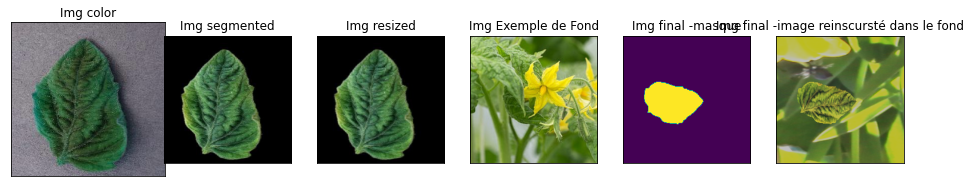

(256, 256, 3)


In [ ]:
#Visualisation de la segmentation
fig = plt.figure(figsize = (16,12))

rdm=random.randint(0,len(df))

#Affichage d'une image aléatoire
print("chemin color = ",df_chemin.iloc[rdm]['chemin_color'])
print("chemin segmented = ",df_chemin.iloc[rdm]['chemin_segmented'])
img_color = cv2.imread(df_chemin.iloc[rdm]['chemin_color'],cv2.IMREAD_COLOR)
img_segmented = cv2.imread(df_chemin.iloc[rdm]['chemin_segmented'], cv2.IMREAD_COLOR)
img_segmented = cv2.cvtColor(img_segmented, cv2.COLOR_BGR2RGB)
img_mod = cv2.resize(img_segmented, (largeur,hauteur))
img_fond = cv2.imread(path_fond,cv2.IMREAD_COLOR)
img_fond = cv2.cvtColor(img_fond, cv2.COLOR_BGR2RGB)
img_fond = cv2.resize(img_fond, (largeur,hauteur))
img_mod = cv2.resize(img_segmented, (largeur,hauteur))

fig.add_subplot(1,6,1)
plt.imshow(img_color)
plt.xticks([])
plt.yticks([])
plt.title('Img color')

fig.add_subplot(1,6,2)
plt.imshow(img_segmented)#cmap='gray'
plt.xticks([])
plt.yticks([])
plt.title('Img segmented')

fig.add_subplot(1,6,3)
plt.imshow(img_mod)#cmap='gray'
plt.xticks([])
plt.yticks([])
plt.title('Img resized')

fig.add_subplot(1,6,4)
plt.imshow(img_fond)
plt.xticks([])
plt.yticks([])
plt.title('Img Exemple de Fond')

#Utilisation de tf.where pour remplacer le fond noir de l'image segmenté
# attention ici ce sont des tensor (-> tensorflow), il faut utiliser np.where (bcp de methode np ont un equivalent tf)
tf_mod = tf.Variable(img_mod)
tf_fond = tf.Variable(img_fond)
tf_final = tf.where(tf_mod<10,tf_fond,tf_mod) 
img_final=np.where(img_mod<10,img_fond,img_mod) 
img_final,masque= preprocess_input2(img_mod,color=True)


fig.add_subplot(1,6,5)
plt.imshow(masque)
plt.xticks([])
plt.yticks([])
plt.title('Img final -masque')

fig.add_subplot(1,6,6)
plt.imshow(img_final/255)
plt.xticks([])
plt.yticks([])
plt.title('Img final -image reinscursté dans le fond')


plt.show()

print(img_segmented.shape)

In [ ]:
img_final

#4.Data generator à deux sorties

In [ ]:
class DataGenerator():
    
    
  def __init__(self, df, sans_fond=False,color=False,resize=True):
    self.df = df        
    self.sans_fond=sans_fond
    self.color = color    
    self.resize=resize

  def generate_splits(self,with_balancing = False):     
        
    '''reproduction de la fonction train_test_split''' 
                              
    permut = np.random.permutation(len(self.df))          # mélange des indices

    # équivalent de data_without_test, data_test = train_test_split(data, test_size=0.2)
    train_up_to = int(len(self.df)*0.8)
    indices_without_test = permut[:train_up_to]           
    test_indices = permut[train_up_to:]
    
        
    # équivalent de data_train, data_validation = train_test_split(data_without_test, test_size=0.2)
    train_up_to = int(train_up_to*0.8)
    train_indices = indices_without_test[:train_up_to]
    valid_indices = indices_without_test[train_up_to:] 


    # Si le flag with_balancing est True, alors les indices des classes combinées plantes-maladie moins représentées sont repetées dans l'ensemble d'apprentissage (uniquement) afin de reequilibrer les effectifs des classes
    if with_balancing :

      code_combine = 1000 *self.df.iloc[train_indices]["code_maladie"]+self.df.iloc[train_indices]['code_plante'];
      code_combine = code_combine.reset_index()
      code_combine.columns = ['indice_echantillon','code_combine']
      rebalance = code_combine['code_combine'].value_counts()
      rebalance = rebalance.iloc[0]/rebalance
      rebalance = rebalance.apply(lambda x: int(x))
            
      supplement_rebalance = []

      for i,indice_ in enumerate(train_indices):

        a= rebalance[code_combine.iloc[i]['code_combine']]     
        if a>1:     

          for j in range(a-1):

            supplement_rebalance.append(indice_)

      train_indices=np.concatenate([train_indices,np.asarray(supplement_rebalance)])


    return train_indices, valid_indices, test_indices     # on retourne les indices


  def generate_images(self, indices, is_training, batch_size=32, step_epoch = 1000000000):  
    '''utilisé pour générer des batchs avec des images lors de l'entraînement/test/validation de notre modèle Keras
    par exemple, on aura "indices=train_indices, is_training=True" pour un générateur d'entraînement
    "indices=test_indices, is_training=False" pour un générateur de test'''
    
    imgs,masks = [], [] # on initialise des listes vides pour contenir ce que renverra le générateur
                                              
    while True:

      nb_step=0

      for i in indices:
                
        echantillon,masque = self.preprocessing(i)
        imgs.append(echantillon)
        masks.append(masque)

        if len(imgs) >= batch_size:
                            
          nb_step +=1

          # dès qu'on a atteind la taille de batch souhaitée, on renvoie les données
          yield np.array(imgs), np.array(masks)
          imgs, masks = [], []
                    
          # à la fin de l'epoch, permutation aléatoire des indices, pourpresenter des batchs différents à l'apprentissage pour l'epoch suivante
          if nb_step>= step_epoch:
            indices=np.random.permutation(indices)
            nb_step=0

        # pour les prédictions, il faut s'arrêter après avoir parcouru toutes les données une fois
      if not is_training:
        break


  def get_images(self,indices):
  #Cette méthode fournit les images de test et ses labels pour l'evaluation des performances en dehors de la boucle d'  apprentissage

    imgs,masks = [], []

    for i in indices:

      echantillon, masque = self.preprocessing(i)
      imgs.append(echantillon)
      masks.append(masque)

    return np.array(imgs),masque

        


  def preprocessing(self,indice):
      # cette méthode lit une image, realise les prétraitement et la conditionne avec le codage des 2 classes en one-hot ncoding 

    # pretraitement sur l'image
    echantillon = cv2.imread(self.df.iloc[indice]['chemin_segmented'], cv2.IMREAD_COLOR)
    echantillon = cv2.cvtColor(echantillon, cv2.COLOR_BGR2RGB)
    echantillon = cv2.resize(echantillon, (largeur,hauteur))
    echantillon,masque  = preprocess_input2(echantillon,sans_fond=self.sans_fond,color=self.color,resize=self.resize)
    echantillon = echantillon / 255
      

    #labels de l'image correspondante                             
    # plante_1hot=to_categorical(self.df.iloc[indice]['code_plante'],num_classes=14)                                 
    # maladie_1hot=to_categorical(self.df.iloc[indice]['code_maladie'],num_classes=21)

    return echantillon,masque
 

In [ ]:

data_generator = DataGenerator(df_chemin_3,color=True)


if not os.path.exists(save_folder):
  #l'argument with balancing réequilibre les classes en repetant les classes les moins fréquentes (x4 taille du jeu d'entrainement)
  train_indices, valid_indices, test_indices = data_generator.generate_splits(with_balancing=False) 
  os.mkdir(save_folder)
  np.savetxt(save_folder+'/train.csv',train_indices,fmt="%d")
  np.savetxt(save_folder+'/test.csv', test_indices,fmt="%d")
  np.savetxt(save_folder+'/valid.csv',valid_indices,fmt="%d")
else :
  train_indices = np.loadtxt(save_folder+'/'+'train.csv').astype(int)
  valid_indices = np.loadtxt(save_folder+'/'+'valid.csv').astype(int)
  test_indices = np.loadtxt(save_folder+'/'+'test.csv').astype(int)

 


#train_indices, valid_indices, test_indices = data_generator.generate_splits() 

batch_size =64

step_epoch = len(train_indices)//batch_size
training_data = data_generator.generate_images(train_indices, is_training=True, batch_size=batch_size,step_epoch = step_epoch)
valid_data = data_generator.generate_images(valid_indices, is_training=True, batch_size=batch_size)
test_data = data_generator.generate_images(test_indices, is_training=False, batch_size=len(test_indices))

#sauvegarde des indices des ensembles de test,validation et entrainement
# pour permettre de tester les modèles sauvegardés
# if not os.path.exists(save_folder):
#   os.mkdir(save_folder)
#   np.savetxt(save_folder+'train.csv',train_indices,fmt="%d")
#   np.savetxt(save_folder+'test.csv', test_indices,fmt="%d")
#   np.savetxt(save_folder+'valid.csv',valid_indices,fmt="%d")

In [ ]:
# #Essai en N&B

# plt.figure(figsize=(40,40))

# p=int(random.random()*10000)
# print('p=',p)
# for i in range(49):
#   plt.subplot(7,7,i+1)
#   test=data_generator.get_images([p])
#   plt.imshow(test[0][0],cmap='gray')

In [ ]:

plt.figure(figsize=(40,40))

p=int(random.random()*10000)
print('p=',p)
for i in range(49):
  plt.subplot(7,7,i+1)
  test=data_generator.get_images([p])
  plt.imshow(test[0][0])

#5.Création et entrainement du modèle

In [ ]:
# Modèle UNET : je ne l'ai pas touché, à part la taille d'entrée, à changer pour une utilisation en couleur

def unet(pretrained_weights = None, input_size = (224,224,3)):
    inputs = Input(input_size)
    conv1 = Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=2)(conv1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2))(conv2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(128, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2))(conv3)
    conv4 = Conv2D(256, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(256, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2))(conv4)
    conv5 = Conv2D(512, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(512, 3, activation='relu', padding='same')(conv5)
    up6 = concatenate([UpSampling2D(size=(2))(conv5), conv4], axis=-1)
    conv6 = Conv2D(256, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(256, 3, activation='relu', padding='same')(conv6)
    up7 = concatenate([UpSampling2D(size=(2))(conv6), conv3], axis=-1)
    conv7 = Conv2D(128, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(128, 3, activation='relu', padding='same')(conv7)
    up8 = concatenate([UpSampling2D(size=(2))(conv7), conv2], axis=-1)
    conv8 = Conv2D(64, 3, activation='relu', padding='same')(up8)
    conv8 = Conv2D(64, 3, activation='relu', padding='same')(conv8)
    up9 = concatenate([UpSampling2D(size=(2))(conv8), conv1], axis=-1)
    conv9 = Conv2D(32, (3), activation='relu', padding='same')(up9)
    conv9 = Conv2D(32, (3), activation='relu', padding='same')(conv9)
    conv10 = Conv2D(1,1, activation='sigmoid')(conv9)

    model_unet = Model(inputs=inputs, outputs=conv10)

    return model_unet


In [ ]:
# Fonction de perte de Jaccard, Intersection over Union
# ref : https://towardsdatascience.com/image-segmentation-choosing-the-correct-metric-aa21fd5751af

def jaccard_loss(y_true, y_pred ):
    """
    Arguments:
        y_true : Matrix containing one-hot encoded class labels 
                 with the last axis being the number of classes.
        y_pred : Matrix with same dimensions as y_true.
        smooth : smoothing factor for loss function.
    """

    intersection = tf.reduce_sum(tf.reduce_sum( y_true * y_pred, axis=-1),axis=-1)
    union = tf.reduce_sum(tf.reduce_sum(y_true + y_pred, axis=-1),axis=-1) - intersection
    jac = (intersection) / (union )
    
    return (1 - jac.numpy())

def jaccard_metrics(y_true, y_pred) :

  return 1-jaccard_loss(y_true,y_pred)

In [ ]:
model_unet = unet()
model_unet.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])

In [ ]:


# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
gpu
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()



  Created wheel for gputil: filename=GPUtil-1.4.0-py3-none-any.whl size=7411 sha256=4e692b7b2e8a87488cc754ad2ace2d702da19414270e3ecddb83fce11df055bf
  Stored in directory: /root/.cache/pip/wheels/6e/f8/83/534c52482d6da64622ddbf72cd93c35d2ef2881b78fd08ff0c
Successfully built gputil
Gen RAM Free: 51.2 GB  | Proc size: 2.9 GB
GPU RAM Free: 15903MB | Used: 377MB | Util   2% | Total 16280MB


In [ ]:
# il vaut mieux avoir une P100, ou encore mieux une V100
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-bbab9b40-80f3-5af7-785b-907aea61e829)


In [ ]:





#os.mkdir(save_folder)
# with open(save_folder+'/model_pickle') as f1:
#   pickel.dump(model,f1)

early_stopping = callbacks.EarlyStopping(monitor='val_loss',
                                          patience=8,
                                          mode='min',
                                          restore_best_weights=True)

lr_plateau = callbacks.ReduceLROnPlateau(monitor='val_loss',
                                          patience=4,
                                          factor=0.5,
                                          verbose=2,
                                          mode='min')


checkpoint = callbacks.ModelCheckpoint(checkpoint_filepath,
                                        monitor='val_accuracy',
                                        verbose=1,
                                        mode='max')

# desactivation des checkpooint : la sauvegarde reguliere du modèle fait atteindre très vite la limite google drive (750 Go / jour)

history = model_unet.fit(training_data,
                                steps_per_epoch=step_epoch,
                                epochs=60,
                                validation_data=valid_data,
                                validation_steps=len(valid_indices)//batch_size,
                                callbacks=[early_stopping,lr_plateau])

model_unet.save(save_folder)

# with open(save_folder+'/history') as f2:
#   pickel.dump(history,f2)

# with open(save_folder+'/model_pickle_fin') as f1:
#   pickel.dump(model,f1)

Epoch 1/60
543/543 [==============================] - 735s 1s/step - loss: 0.6120 - accuracy: 0.6696 - val_loss: 0.5613 - val_accuracy: 0.7178 - lr: 0.0010
Epoch 2/60
543/543 [==============================] - 730s 1s/step - loss: 0.4377 - accuracy: 0.7913 - val_loss: 0.2243 - val_accuracy: 0.9088 - lr: 0.0010
Epoch 3/60
543/543 [==============================] - 731s 1s/step - loss: 0.1479 - accuracy: 0.9413 - val_loss: 0.0909 - val_accuracy: 0.9655 - lr: 0.0010
Epoch 4/60
543/543 [==============================] - 701s 1s/step - loss: 0.0688 - accuracy: 0.9745 - val_loss: 0.0487 - val_accuracy: 0.9822 - lr: 0.0010
Epoch 5/60
543/543 [==============================] - 690s 1s/step - loss: 0.0480 - accuracy: 0.9825 - val_loss: 0.0361 - val_accuracy: 0.9868 - lr: 0.0010
Epoch 6/60
543/543 [==============================] - 692s 1s/step - loss: 0.0410 - accuracy: 0.9852 - val_loss: 0.0321 - val_accuracy: 0.9887 - lr: 0.0010
Epoch 7/60
543/543 [==============================] - 702s 1s/st

In [ ]:
model_unet2=model_unet
history = model_unet2.fit(training_data,
                                steps_per_epoch=step_epoch,
                                epochs=60,
                                validation_data=valid_data,
                                validation_steps=len(valid_indices)//batch_size,
                                callbacks=[early_stopping,lr_plateau])

model_unet2.save(save_folder+'/suite')

In [ ]:
# 543 steps par epoch * 64 (batch size ) = 34000 presentations fond+feuille vs 10000 fonds, 
# il n'y en a pas encore assez ! en moyenne ils seront vu 3.5 fois par epoch, sur N epoch, ils risquent d'être appris par coeur
#En faisant 20 epochs, il faut viser 700000 images de fonds

#6.Résultats

## Performances sur le jeu de test pour les feuilles et les fonds de l'apprentissage

In [ ]:
#chargement du modèle 
model_unet = load_model(save_folder)

In [ ]:
#liste_img_fond = liste_img_old

IoU = 0.9989259245999069


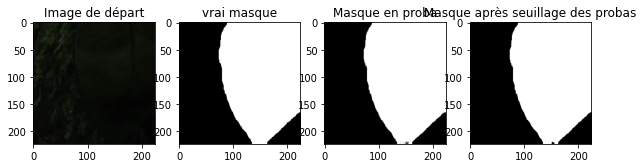

In [ ]:
# peut-être executé plusieurs fois 

ind = int(random.random()*10000)
test = data_generator.get_images([test_indices[ind]])
plt.figure(figsize=(10,20))
plt.subplot(141)
plt.imshow(test[0][0])
plt.title('Image de départ')
plt.subplot(142)
plt.imshow(test[1],cmap='gray')
plt.title('vrai masque')
test_pred = model_unet.predict(test[0])
plt.subplot(143)
plt.imshow(np.squeeze(test_pred[0]),cmap='gray')
plt.title('Masque en proba')
masque_pred = test_pred[0]
proba_seuil=.5
masque_pred[masque_pred>proba_seuil]=1
masque_pred[masque_pred<=proba_seuil]=0
plt.subplot(144)
plt.imshow(np.squeeze(masque_pred),cmap='gray')
plt.title('Masque après seuillage des probas')

# Affichage de la bonne métrique de test
print("IoU =",jaccard_metrics(test[1],np.squeeze(test_pred[0])))

In [ ]:
# calcul de la métrique de jaccard (Intersection over Union) pour toutes les feuilles de l'ensemble de test
# c'est long ! : 9min

IoU = []

for i,j in enumerate(test_indices):
  test = data_generator.get_images([j])
  test_pred = model_unet.predict(test[0])
  m=jaccard_metrics(test[1],np.squeeze(test_pred[0]))
  IoU.append(m)
  #print(i,j,"IoU =",m)

c'est pas mal !


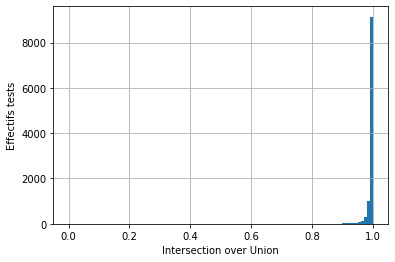

In [ ]:
plt.hist(IoU,bins=100),
plt.xlabel('Intersection over Union')
plt.ylabel('Effectifs tests')
plt.grid(True)
print("c'est pas mal !")

## Performances sur le jeu de test ^pour les feuilles et les fonds étrangers (les images de jardin)

In [ ]:
#on change les fonds et on reprend les anciens
# les photos d'apprentissage sont sauvées dans la variable liste_img_old pour ne pas avoir à les reconstruire (20 min)

liste_img_old = liste_img_fond



liste_img_fond = []

#Recherche et chagement de la liste des images de fonds
for fichier in glob.glob(chemin_image_fond + '/**/*.*', recursive=True):
  img_fond = cv2.imread(fichier)
  #img_fond = cv2.cvtColor(img_fond, cv2.COLOR_BGR2RGB)
  img_fond = cv2.resize(img_fond, (largeur,hauteur))
  liste_img_fond.append(img_fond)


IoU = 0.1414685560370067


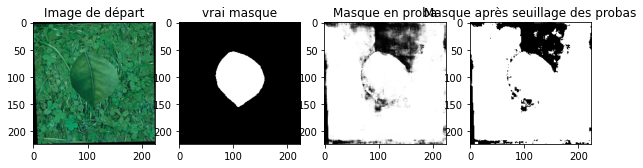

In [ ]:
# peut-être executé plusieurs fois 

ind = int(random.random()*10000)
test = data_generator.get_images([test_indices[ind]])
plt.figure(figsize=(10,20))
plt.subplot(141)
plt.imshow(test[0][0])
plt.title('Image de départ')
plt.subplot(142)
plt.imshow(test[1],cmap='gray')
plt.title('vrai masque')
test_pred = model_unet.predict(test[0])
plt.subplot(143)
plt.imshow(np.squeeze(test_pred[0]),cmap='gray')
plt.title('Masque en proba')
masque_pred = test_pred[0]
proba_seuil=.5
masque_pred[masque_pred>proba_seuil]=1
masque_pred[masque_pred<=proba_seuil]=0
plt.subplot(144)
plt.imshow(np.squeeze(masque_pred),cmap='gray')
plt.title('Masque après seuillage des probas')

# Affichage de la bonne métrique de test
print("IoU =",jaccard_metrics(test[1],np.squeeze(test_pred[0])))

In [ ]:
# calcul de la métrique de jaccard (Intersection over Union) pour toutes les feuilles de l'ensemble de test avec les fonds étrangers 
# c'est long ! (9 min c'est pareil)

IoU = []

for i,j in enumerate(test_indices):
  test = data_generator.get_images([j])
  test_pred = model_unet.predict(test[0])
  m=jaccard_metrics(test[1],np.squeeze(test_pred[0]))
  IoU.append(m)
  #print(i,j,"IoU =",m)

c'est moins bien déjà: beaucoup d'échantillo à IoU faibles


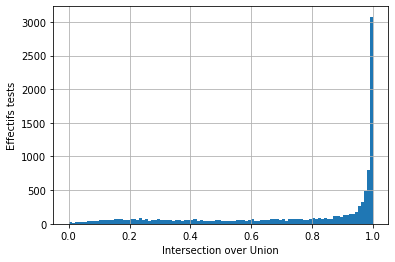

In [ ]:
plt.hist(IoU,bins=100),
plt.xlabel('Intersection over Union')
plt.ylabel('Effectifs tests')
plt.grid(True)
print("c'est moins bien déjà: beaucoup d'échantillo à IoU faibles")



##Prédictions sur les données réelles

### premier jeu de test de données réelles

In [ ]:
#cellule déjà executée au debut du notebook pour le premier jeu de test

# chemin_images_reelles = 'images_reelles'
# emplacement_src_gdrive = '/gdrive/MyDrive/epyphyte/donnees/test'

# import shutil
# #if not os.path.isdir('/chemin_images_reelles'):
# shutil.copytree(emplacement_src_gdrive,chemin_images_reelles)

# df_chemin_test=repertoire_test_to_df(chemin_images_reelles)
# df_chemin_test.head()

In [ ]:

chemin_images_reelles = 'images_reelles'
emplacement_src_gdrive = '/gdrive/MyDrive/epyphyte/donnees/test'

import shutil
#if  not os.path.isdir('chemin_images_relles'):
#shutil.copytree(emplacement_src_gdrive,chemin_images_reelles)

df_chemin_test=repertoire_test_to_df(chemin_images_reelles)
df_chemin_test.head()


data_gen_reel = DataGenerator(df_chemin_test, sans_fond=True,color=True,resize=False)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


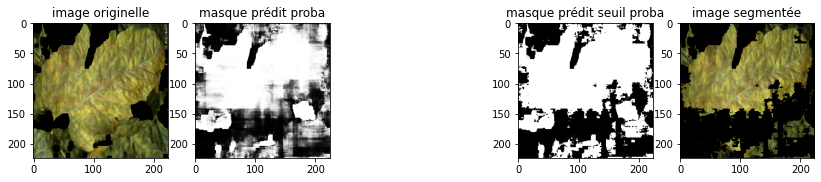

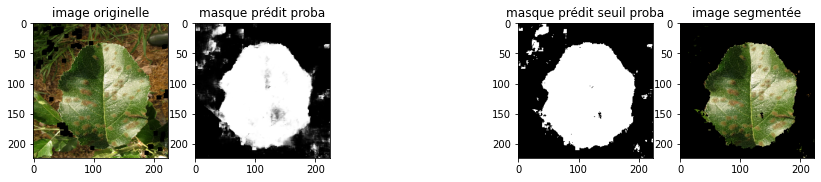

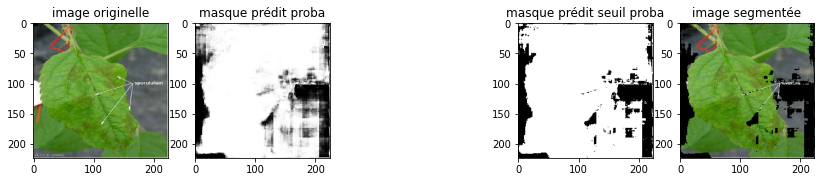

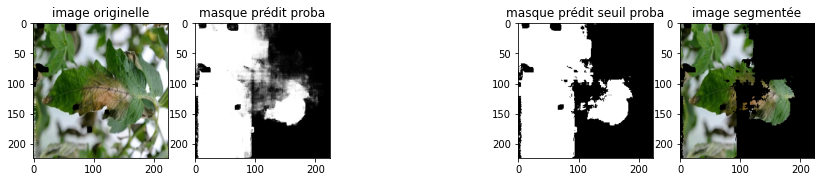

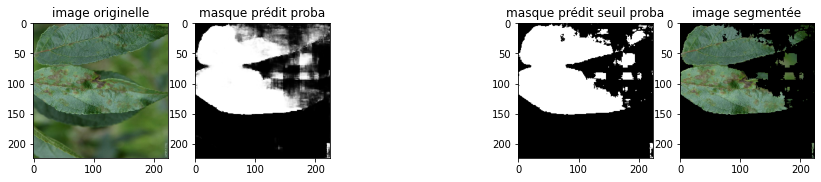

...

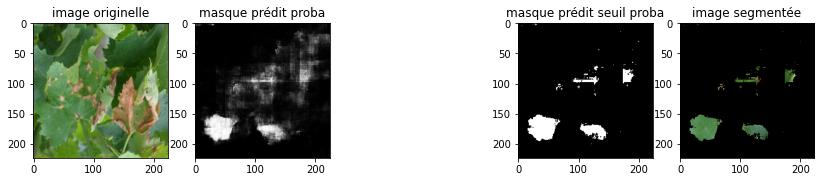

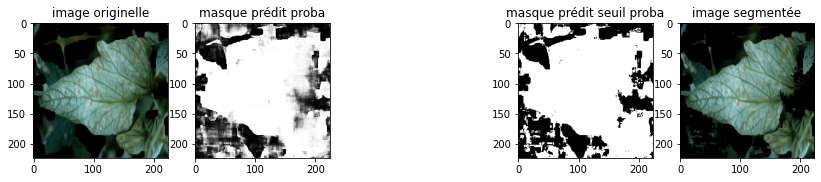

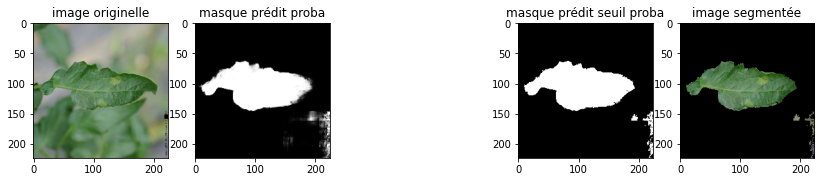

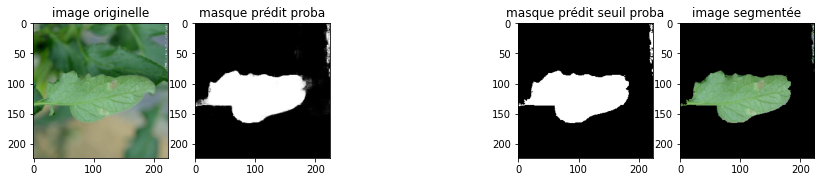

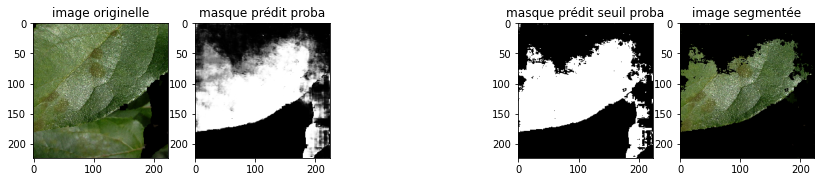

In [ ]:


#pas terrible, les images de test sont chargées une par une.
# à voir plus tard si on peut les charger toutes d'un coup ou par batch pour
#réduire la boucle
permut = np.random.permutation(np.arange(len(df_chemin_test)))
#permut = permut[:20]

for i in permut:

  test = data_gen_reel.get_images([i])


  img_nb = test[0]
  masque =model_unet.predict(img_nb)
  masque=np.squeeze(masque)
  masque.shape = (224,224,1)


  proba_seuil = .5
  masque_bin =  np.where(masque>proba_seuil,np.ones(shape=(224,224,1)),np.zeros(shape=(224,224,1)))
  masque_color = np.tile(masque_bin,(1,1,3))
  img_test_segmented = np.where(masque_color==1,test[0][0],np.zeros(shape=(224,224,3)))
  img_test_segmented.shape=(1,224,224,3)
  plt.figure(figsize=(14,14))
  plt.subplot(151)
  plt.imshow(test[0][0])
  plt.title('image originelle')
  plt.subplot(152)
  plt.imshow(np.squeeze(masque),cmap='gray')
  plt.title('masque prédit proba')
  plt.subplot(154)
  plt.imshow(np.squeeze(masque_bin),cmap='gray')
  plt.title('masque prédit seuil proba')
  plt.subplot(155)
  plt.imshow( np.squeeze(img_test_segmented))
  plt.title('image segmentée')



  # df_chemin_test.iloc[i]['code_plante_pred']=code_plante_pred
  # df_chemin_test.iloc[i]['code_maladie_pred']=code_maladie_pred










### Essai sur jeu de données test4

In [ ]:
def repertoire_test_to_df2(chemin):


  #Construction du DataFrame avec le chemin des images et les catégories
  df_chemin = pd.DataFrame()
  #for (repertoire, sousRepertoires, fichiers) in os.walk(path_segmented):
  for (repertoire, sousRepertoires, fichiers) in os.walk(chemin):
      df_temp = pd.DataFrame(data=fichiers, columns=['fichier'])
      df_temp['dossier'] = repertoire
      df_chemin = pd.concat([df_chemin, df_temp], axis = 0)

  df_chemin['chemin_segmented'] = df_chemin['dossier'] +'/'+ df_chemin['fichier']

  df_chemin['dossier']=df_chemin['dossier'].apply(lambda x: x[15:])
 

  df_chemin = df_chemin.drop('dossier', axis=1)
  df_chemin = df_chemin.drop('fichier', axis=1)

  return df_chemin

In [ ]:

chemin_images_reelles = 'images_reelles_test4'
emplacement_src_gdrive = '/gdrive/MyDrive/epyphyte/donnees/test4'

import shutil
#if  not os.path.isdir('chemin_images_relles'):
shutil.copytree(emplacement_src_gdrive,chemin_images_reelles)

df_chemin_test=repertoire_test_to_df2(chemin_images_reelles)
df_chemin_test.head()


data_gen_reel = DataGenerator(df_chemin_test, sans_fond=True,color=True,resize=False)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


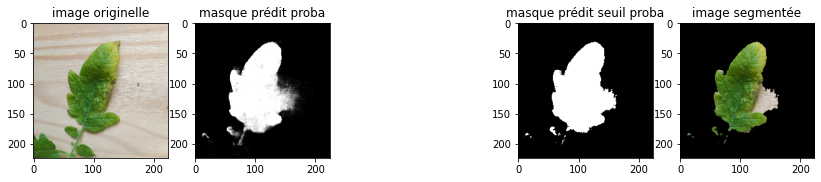

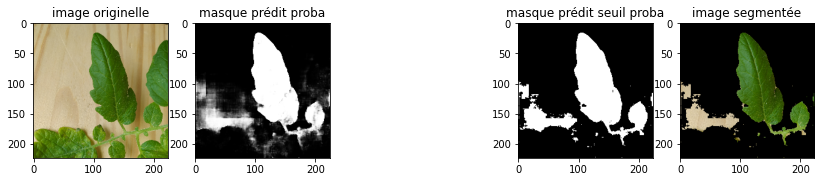

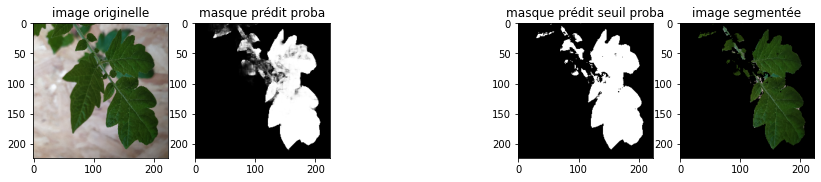

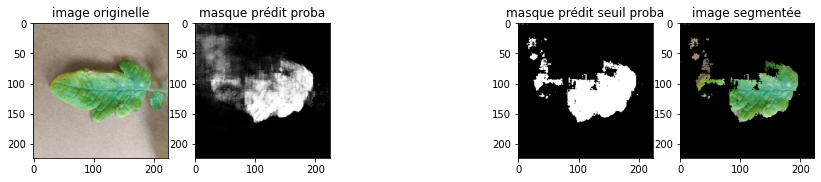

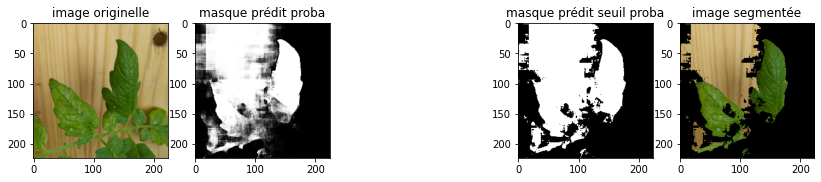

...

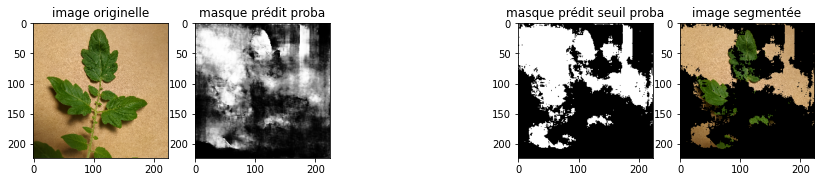

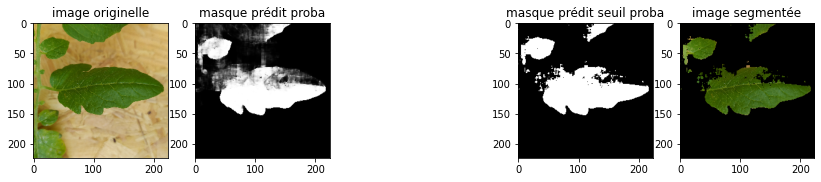

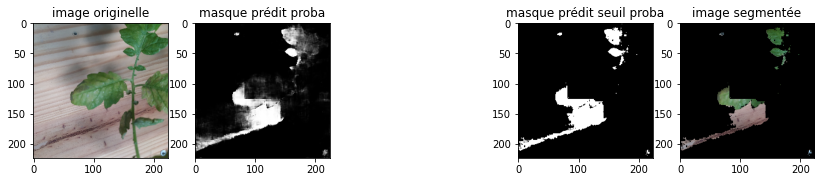

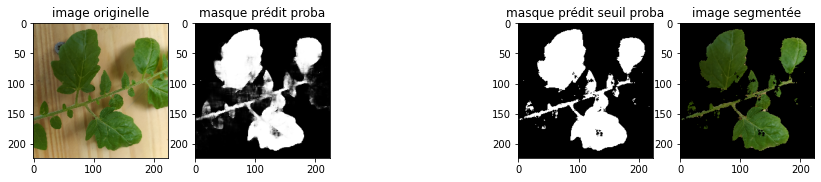

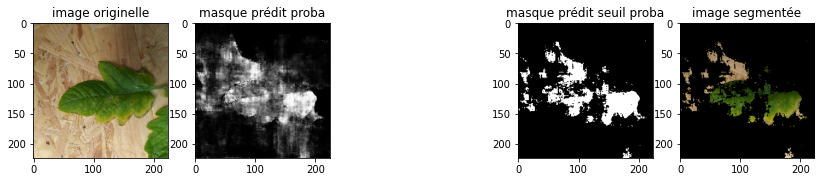

In [ ]:


#pas terrible, les images de test sont chargées une par une.
# à voir plus tard si on peut les charger toutes d'un coup ou par batch pour
#réduire la boucle
permut = np.random.permutation(np.arange(len(df_chemin_test)))
#permut = permut[:20]


for i in permut:

  test = data_gen_reel.get_images([i])


  img_nb = test[0]
  masque =model_unet.predict(img_nb)
  masque=np.squeeze(masque)
  masque.shape = (224,224,1)


  proba_seuil = .5
  masque_bin =  np.where(masque>proba_seuil,np.ones(shape=(224,224,1)),np.zeros(shape=(224,224,1)))
  masque_color = np.tile(masque_bin,(1,1,3))
  img_test_segmented = np.where(masque_color==1,test[0][0],np.zeros(shape=(224,224,3)))
  img_test_segmented.shape=(1,224,224,3)
  plt.figure(figsize=(14,14))
  plt.subplot(151)
  plt.imshow(test[0][0])
  plt.title('image originelle')
  plt.subplot(152)
  plt.imshow(np.squeeze(masque),cmap='gray')
  plt.title('masque prédit proba')
  plt.subplot(154)
  plt.imshow(np.squeeze(masque_bin),cmap='gray')
  plt.title('masque prédit seuil proba')
  plt.subplot(155)
  plt.imshow( np.squeeze(img_test_segmented))
  plt.title('image segmentée')


  # df_chemin_test.iloc[i]['code_plante_pred']=code_plante_pred
  # df_chemin_test.iloc[i]['code_maladie_pred']=code_maladie_pred










#7. Conclusions